# San Diego Bike Traffic Crash Analysis

## Project Summary
In 2013, the City of San Deigo passed the Bicycle Master Plan that promotes biking activities and biking safety. Specifically, the Plan proposed new bike lanes to be constructed. I look at the historical bike-related traffic crash data before and after the issuance of the bike master plan to examine whether the plan is effective in reducing traffic collisions involving bicycles.

The following steps were taken to analyze the factors that impact the bike crash rate of a bike lane.
* Cleaning of the collision data. All entries are geocoded and assigned with coordinates so it's ready to be mapped for future spatial analysis.
* Summary table of collision data by year and severity level using groupby
* Collision data visualization by year and severity level
* Cleaning of the party data. 
* Visualize party data to examine the race, age, and injury level patterns
* Pivoted and joined Party data to collision data (many to one) for future analysis
* Identify the key variables used to measure the effectiveness of the Plan on reducing bike collisions
* Use geoprocessing analysis to examine whether the bike collision pattern is associated with any bike corridors
* Test the correaltions

Expected Outcome:
* The Plan improved bike safety by reducing overall collisions and collision serverity. 


Data source: 2009-2019 bike collisions were downloaded from https://tims.berkeley.edu/help/SWITRS.php#Codebook

In [1]:
import json      # library for working with JSON-formatted text strings
import requests  # library for accessing content from web URLs

import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

%matplotlib inline

import seaborn as sns
sns.set()

import geopandas as gpd
from shapely.geometry import Point
from scipy import ndimage
import matplotlib.pylab as pylab
import matplotlib.pyplot as plt

pylab.rcParams['figure.figsize'] = 10, 8

from mapbox import Geocoder
import os

from mapboxgl.viz import *
from mapboxgl.utils import *

from geojson import Feature, Point, FeatureCollection

import pprint    # library for cleanly printing Python data structures
pp = pprint.PrettyPrinter()

from patsy import dmatrices
from scipy.stats import norm

import warnings
warnings.filterwarnings('ignore')

%env MAPBOX_ACCESS_TOKEN=pk.eyJ1Ijoiandhbmdrb2EiLCJhIjoiY2pvOHZoM3c1MWFlZzNwcGI5aG56eWV3bCJ9.fL_tA706ZiINMj26vZ9PYw
#Mapbox key has been set in the environment.

env: MAPBOX_ACCESS_TOKEN=pk.eyJ1Ijoiandhbmdrb2EiLCJhIjoiY2pvOHZoM3c1MWFlZzNwcGI5aG56eWV3bCJ9.fL_tA706ZiINMj26vZ9PYw


## Reading and Cleaning Collision data
Getting rid of unwanted columns, make sure all rows in the dataset have coordinates for future spatial analysis.

In [5]:
cols = pd.read_csv('data/collisions.csv')
cols.head()

,CASE_ID,ACCIDENT_YEAR,PROC_DATE,JURIS,COLLISION_DATE,COLLISION_TIME,OFFICER_ID,REPORTING_DISTRICT,DAY_OF_WEEK,CHP_SHIFT,...,COUNT_MC_KILLED,COUNT_MC_INJURED,PRIMARY_RAMP,SECONDARY_RAMP,LATITUDE,LONGITUDE,COUNTY,CITY,POINT_X,POINT_Y
0,3984282,2009,2010-09-14,3711,2009-01-06,1916,3815,NaN,2,5,...,0,0,-,-,NaN,NaN,SAN DIEGO,SAN DIEGO,-117.096975,32.953437
1,4027523,2009,2009-09-04,3711,2009-01-24,23,8374,NaN,6,5,...,0,0,-,-,NaN,NaN,SAN DIEGO,SAN DIEGO,NaN,NaN
2,4027529,2009,2009-09-04,3711,2009-01-18,1350,6266,NaN,7,5,...,0,0,-,-,NaN,NaN,SAN DIEGO,SAN DIEGO,-117.138810,32.750290
3,4027535,2009,2009-09-08,3711,2009-01-23,730,8858,SAPD,5,5,...,0,0,-,-,NaN,NaN,SAN DIEGO,SAN DIEGO,NaN,NaN
4,4027541,2009,2009-09-04,3711,2009-01-25,825,5976,NaN,7,5,...,0,0,-,-,NaN,NaN,SAN DIEGO,SAN DIEGO,-117.189167,32.798299


In [6]:
print(list(cols.columns))

# delete unwanted columns
cols.drop(columns=['PROC_DATE', 'JURIS','OFFICER_ID', 'REPORTING_DISTRICT','CHP_SHIFT', 'POPULATION','CNTY_CITY_LOC','SPECIAL_COND', 
                   'BEAT_TYPE', 'CHP_BEAT_TYPE', 'CITY_DIVISION_LAPD', 'CHP_BEAT_CLASS', 'BEAT_NUMBER', 'STATE_HWY_IND',
                   'CALTRANS_COUNTY', 'CALTRANS_DISTRICT','STWD_VEHTYPE_AT_FAULT', 'CHP_VEHTYPE_AT_FAULT'], inplace=True)

['CASE_ID', 'ACCIDENT_YEAR', 'PROC_DATE', 'JURIS', 'COLLISION_DATE', 'COLLISION_TIME', 'OFFICER_ID', 'REPORTING_DISTRICT', 'DAY_OF_WEEK', 'CHP_SHIFT', 'POPULATION', 'CNTY_CITY_LOC', 'SPECIAL_COND', 'BEAT_TYPE', 'CHP_BEAT_TYPE', 'CITY_DIVISION_LAPD', 'CHP_BEAT_CLASS', 'BEAT_NUMBER', 'PRIMARY_RD', 'SECONDARY_RD', 'DISTANCE', 'DIRECTION', 'INTERSECTION', 'WEATHER_1', 'WEATHER_2', 'STATE_HWY_IND', 'CALTRANS_COUNTY', 'CALTRANS_DISTRICT', 'STATE_ROUTE', 'ROUTE_SUFFIX', 'POSTMILE_PREFIX', 'POSTMILE', 'LOCATION_TYPE', 'RAMP_INTERSECTION', 'SIDE_OF_HWY', 'TOW_AWAY', 'COLLISION_SEVERITY', 'NUMBER_KILLED', 'NUMBER_INJURED', 'PARTY_COUNT', 'PRIMARY_COLL_FACTOR', 'PCF_CODE_OF_VIOL', 'PCF_VIOL_CATEGORY', 'PCF_VIOLATION', 'PCF_VIOL_SUBSECTION', 'HIT_AND_RUN', 'TYPE_OF_COLLISION', 'MVIW', 'PED_ACTION', 'ROAD_SURFACE', 'ROAD_COND_1', 'ROAD_COND_2', 'LIGHTING', 'CONTROL_DEVICE', 'CHP_ROAD_TYPE', 'PEDESTRIAN_ACCIDENT', 'BICYCLE_ACCIDENT', 'MOTORCYCLE_ACCIDENT', 'TRUCK_ACCIDENT', 'NOT_PRIVATE_PROPERTY', '

In [7]:
#both "LATITUDE	LONGITUDE" and "POINT_X	POINT_Y" columns contain coordinates. Need to consolidate.
cols['POINT_X'].isnull().value_counts()

False    4579
True      607
Name: POINT_X, dtype: int64

In [8]:
#Fill empty POINT_X/POINT_Y rows with coordinates from "LATITUDE	LONGITUDE" 
cols['POINT_X'].fillna(cols['LONGITUDE'],inplace=True)
cols['POINT_Y'].fillna(cols['LATITUDE'],inplace=True)
cols.drop(columns=['LATITUDE', 'LONGITUDE'], inplace=True)
cols['POINT_X'].isnull().value_counts()

False    4597
True      589
Name: POINT_X, dtype: int64

In [9]:
# Better but still a lot of missing values. Need to geocode using intersections
cols["intName"]=cols["PRIMARY_RD"]+ ' and '+cols['SECONDARY_RD']+', San Diego, USA'
geocoder = Geocoder(access_token = os.environ['MAPBOX_ACCESS_TOKEN'])

In [10]:
#Use mapbox to geocode intersections. Write the output coordinates to POINT_X/POINT_Y when they're missing
for i in range(len(cols["intName"])):
    if (str(cols['POINT_X'][i])=='nan') and (cols["PRIMARY_RD"][i]!=cols['SECONDARY_RD'][i]):
        geoaddress = geocoder.forward(address=cols["intName"][i],limit=1).geojson()['features'][0]['geometry']['coordinates']
        cols.loc[i,'POINT_X']=geoaddress[0]
        cols.loc[i,'POINT_Y']=geoaddress[1]
        print (cols["intName"][i]+":",cols['POINT_X'][i],",",cols['POINT_Y'][i])
print ("compelete")

TAYLOR ST and RT 8, San Diego, USA: -117.1628 , 32.7174
VENTURA PL and STRAND WY, San Diego, USA: -117.1628 , 32.7174
WEST POINT LOMA BL and NIMITZ BL, San Diego, USA: -97.9222112121185 , 39.3812661305678
NORTH HARBOR DR and SPANISH LANDING RD, San Diego, USA: -117.1628 , 32.7174
ROSECRANS ST and SIDEWALK, San Diego, USA: -117.1628 , 32.7174
WEST MISSION BAY DR and QUIVIRA RD, San Diego, USA: -117.1628 , 32.7174
UNIVERSITY AV and A, San Diego, USA: -117.1628 , 32.7174
UNIVERSITY AV and CURBLINE, San Diego, USA: -117.0681573 , 32.7508836
NORTH HARBOR DR and MEDIA RD, San Diego, USA: -117.1628 , 32.7174
HARBOR DR and STATION LINE, San Diego, USA: -117.1628 , 32.7174
KIOWA DR and PERIMETER RD, San Diego, USA: -117.1628 , 32.7174
EVERETT ST and GRAND AV, San Diego, USA: -117.1628 , 32.7174
TOURMALINE ST and TOURMALINE SURF PARK, San Diego, USA: -117.1628 , 32.7174
NORTH TORREY PINES RD and SCIENCE PARK RD, San Diego, USA: -117.2427885 , 32.901654
WEST POINT LOMA BL and RUE D' ORLEANS, San 

ACCESS RD and NORTH HARBOR DR, San Diego, USA: -117.1628 , 32.7174
FAIRMOUNT AV and BIKE OVERPASS PILLAR, San Diego, USA: -117.1006052 , 32.7327208
POINT LOMA BL and POINT LOMA BL 5100, San Diego, USA: -97.9222112121185 , 39.3812661305678
MARYLAND ST and MARYLAND ST 4200, San Diego, USA: -76.3794 , 39.669
OCEAN VIEW BL and SOUTH 47TH ST, San Diego, USA: -117.1628 , 32.7174
POMERADO RD and STONEBRIDGE PKWY, San Diego, USA: -117.0591301 , 32.9230746
SCRIPPS LAKE and WALKING PATH AROUN, San Diego, USA: -117.1034693 , 32.9114187
EL CAMINIO REAL and RUETTE SAN RAPHAEL FIRE ACCESS ROAD, San Diego, USA: -117.231473 , 32.925346
MAIN ST and MAIN ST 3700, San Diego, USA: -117.1628 , 32.7174
SEA WORLD DR and RT 15, San Diego, USA: -117.1628 , 32.7174
S ALLEY 2600 IMPERIAL AV and 26TH ST, San Diego, USA: -117.1628 , 32.7174
HIGHLAND VALLEY RD and LIGHT POLE P617255, San Diego, USA: -117.1628 , 32.7174
CONGRESS ST and OLD TOWN STATION TRANSIT BUS EXIT, San Diego, USA: -117.1628 , 32.7174
SUNSET CLI

SAN PASQUAL VALLEY RD and BUNDY CANYON, San Diego, USA: -117.1628 , 32.7174
30TH ST and 4200 30TH ST, San Diego, USA: -76.3794 , 39.669
CARGILL AV and DOYLE COMMUNITY PK, San Diego, USA: -76.7677 , 38.2562
RT 56 BIKE PATH and TANG DR, San Diego, USA: -117.1628 , 32.7174
NORTH TORREY PINES RD and UCSD NORTHPOINT DRVY, San Diego, USA: -117.1628 , 32.7174
TONY GWYNN and K ST, San Diego, USA: -117.1628 , 32.7174
WEST WASHINGTON ST and W UNIVERSITY AV, San Diego, USA: -117.1628 , 32.7174
POMERADO RD and POMERADO RD 10200, San Diego, USA: -117.1628 , 32.7174
GRAND AV and TORREY PINES RD, San Diego, USA: -117.1628 , 32.7174
MISSION GORGE RD and MISSION GORGE RD 4500, San Diego, USA: -117.1628 , 32.7174
FAIRMOUNT AV and GORE PT  MONTEZUMA RAMP, San Diego, USA: -8.65528 , 40.63889
PENASQUITOS BL and PASEO MONTRIL, San Diego, USA: -117.1628 , 32.7174
ALVARADO RD and SDSU PARKING, San Diego, USA: -117.1628 , 32.7174
NORTH TORREY PINES RD and SCENIC PARK RD, San Diego, USA: -117.1628 , 32.7174
RT 

SORRENTO VALLEY RD and SORRENTO COASTER STATION, San Diego, USA: -117.1628 , 32.7174
UNIVERSITY AV and UNIVERSITY SQ DY, San Diego, USA: -117.1628 , 32.7174
EL CAJON BL and EL CAJON BL 3800, San Diego, USA: -116.9625 , 32.7948
PARK BL and PARK BL 1400, San Diego, USA: -100.3587 , 39.1125
MURPHY CANYON RD and NORTH AV, San Diego, USA: -117.1628 , 32.7174
UNIVERSITY AV and 10TH AV, San Diego, USA: -117.1552998 , 32.7484843
POINT LOMA BL and POINT LOMA BL 4600, San Diego, USA: -95.8714 , 32.9315
HOTEL CIRCLE PL and HOTEL CIRCLE PL 2495, San Diego, USA: -117.1628 , 32.7174
RICHARD ST and RICHARD ST 6852, San Diego, USA: -76.3794 , 39.669
TORREY PINES RD and NATIONAL UNIVERSITY SYSTEM DRWY, San Diego, USA: -117.2521 , 32.905
LANDIS ST and LANDIS ST 3100, San Diego, USA: -76.3794 , 39.669
W ALLY ONONDAGA AV and ONONDAGA AV 4500, San Diego, USA: -76.7677 , 38.2562
FAIRMONT AV and FAIRMONT AV 5100, San Diego, USA: -117.1628 , 32.7174
WEST WASHINGTON ST and W WASHINGTON ST 141, San Diego, USA: 

TRUXTUN RD and TRUXTUN RD 2400, San Diego, USA: -117.1628 , 32.7174
CHATSWORTH BL and CHATSWORTH 2100, San Diego, USA: -118.6023 , 34.2596
POLK AV and POLK AV 4400, San Diego, USA: -117.1628 , 32.7174
CLAIREMONT DR and CLAIREMONT DR 2300, San Diego, USA: -117.1628 , 32.7174
INGRAHAM ST and INGRAHAM ST 3800, San Diego, USA: -76.3794 , 39.669
MONROE AV and MONROE AV 5100, San Diego, USA: -117.1628 , 32.7174
HIBISCUS LN and INGRAHAM ST, San Diego, USA: -117.1628 , 32.7174
SHELTER ISLAND DR and NORTH HARBOR DR, San Diego, USA: -117.175073 , 32.71442
NAVAJO RD and NAVAJO RD 8800, San Diego, USA: -117.1628 , 32.7174
MONUMENT RD and SATURN BL, San Diego, USA: -117.092728 , 32.544533
UPAS ST and UPAS ST 100, San Diego, USA: -76.3794 , 39.669
SUNSET CLIFFS and QUIVIRA ACCESS RD, San Diego, USA: -117.2532 , 32.7305
LUSK BL and LUSK BL 7300, San Diego, USA: -97.9222112121185 , 39.3812661305678
PACIFIC BEACH DR and PACIFIC BEACH DR 700, San Diego, USA: -117.1628 , 32.7174
NORTH TORREY PINES RD and

In [11]:
#drop collisions that didn't get geocoded
cols=cols[cols['POINT_X'].notnull()]

cols['POINT_X'].isnull().value_counts()

False    5115
Name: POINT_X, dtype: int64

In [12]:
#Getting rid of collisions that weren't correctly geocoded

cols=cols[np.logical_and((cols['POINT_X']< -116), (cols['POINT_X']> -117.3)) & 
          np.logical_and((cols['POINT_Y']>31), (cols['POINT_Y']<33))]
cols=cols[cols['POINT_X']!=-117.1628]
cols.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4625 entries, 0 to 5185
Data columns (total 61 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   CASE_ID                  4625 non-null   int64  
 1   ACCIDENT_YEAR            4625 non-null   int64  
 2   COLLISION_DATE           4625 non-null   object 
 3   COLLISION_TIME           4625 non-null   int64  
 4   DAY_OF_WEEK              4625 non-null   int64  
 5   PRIMARY_RD               4625 non-null   object 
 6   SECONDARY_RD             4625 non-null   object 
 7   DISTANCE                 4625 non-null   float64
 8   DIRECTION                2956 non-null   object 
 9   INTERSECTION             4625 non-null   object 
 10  WEATHER_1                4625 non-null   object 
 11  WEATHER_2                4625 non-null   object 
 12  STATE_ROUTE              181 non-null    float64
 13  ROUTE_SUFFIX             169 non-null    object 
 14  POSTMILE_PREFIX         

## Analyze and Visualize Collision Data
Now that all rows in cols have coordinates, we want to examine the overall collision patterns using tables and charts.

In [13]:
#Create a pivot table to look at collision serverity level over time.

colsByYr=cols.groupby([cols['ACCIDENT_YEAR'],cols['COLLISION_SEVERITY']]).count().reset_index().pivot(columns = 'COLLISION_SEVERITY',index='ACCIDENT_YEAR')["CASE_ID"]

sev_codebook={1:'Fatal',2:'Severe Injury',3:'Visible Injury',4:'Complaint of Pain'}

colsByYr.columns=sev_codebook.values()

colsByYr

,Fatal,Severe Injury,Visible Injury,Complaint of Pain
ACCIDENT_YEAR,,,,
2009,6.0,40.0,269.0,132.0
2010,2.0,20.0,273.0,125.0
2011,7.0,26.0,328.0,127.0
2012,7.0,29.0,299.0,124.0
2013,3.0,25.0,250.0,144.0
2014,3.0,28.0,318.0,136.0
2015,3.0,22.0,289.0,151.0
2016,2.0,21.0,228.0,146.0
2017,NaN,24.0,194.0,134.0


<AxesSubplot:title={'center':'San Deigo Bike Crashes by Severity (2009-2019)'}, xlabel='ACCIDENT_YEAR'>

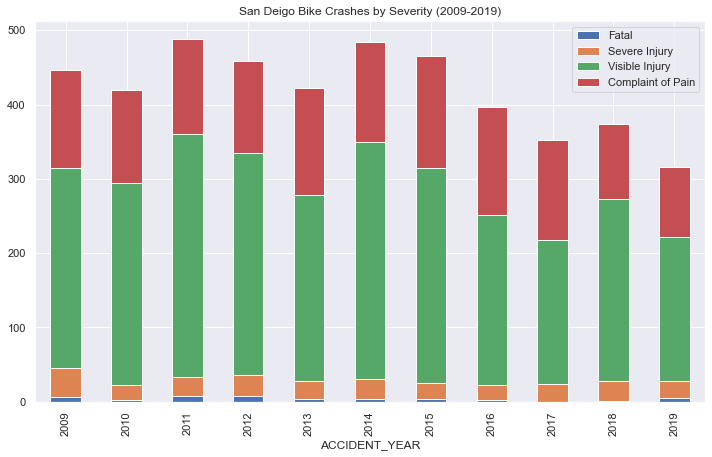

In [19]:
#Visualize the table using stacked bar chart.

colsByYr.plot(kind='bar', stacked=True, figsize=[12,7],title='San Deigo Bike Crashes by Severity (2009-2019)')

## Party Data Analysis and Visualization
The second dataset to access is the parties involved in each bike collision. We'll examine the age and race of the parties and their injury levels.

In [335]:
pt=pd.read_csv('data/parties.csv')
pt.head()

,CASE_ID,PARTY_NUMBER,PARTY_TYPE,AT_FAULT,PARTY_SEX,PARTY_AGE,PARTY_SOBRIETY,PARTY_DRUG_PHYSICAL,DIR_OF_TRAVEL,PARTY_SAFETY_EQUIP_1,...,VEHICLE_YEAR,VEHICLE_MAKE,STWD_VEHICLE_TYPE,CHP_VEH_TYPE_TOWING,CHP_VEH_TYPE_TOWED,RACE,INATTENTION,SPECIAL_INFO_F,SPECIAL_INFO_G,ACCIDENT_YEAR
0,3984282,1,1,Y,M,55,A,-,N,M,...,2002.0,BMW,A,01,00,W,NaN,-,-,2009
1,3984282,2,4,N,M,55,A,-,N,-,...,NaN,-,L,04,00,W,NaN,-,-,2009
2,4027523,1,1,Y,-,998,G,G,E,-,...,NaN,-,-,-,00,NaN,NaN,-,-,2009
3,4027523,2,4,N,M,24,A,-,E,-,...,NaN,-,L,04,00,W,NaN,-,-,2009
4,4027529,1,4,Y,F,14,A,-,S,-,...,NaN,-,L,04,00,W,NaN,-,-,2009


<AxesSubplot:xlabel='RACE', ylabel='count'>

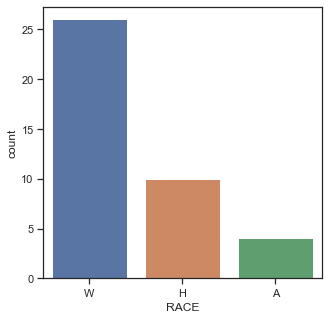

In [336]:
#Number of people killed in a bike collision by race
plt.figure(1, figsize=(5,5), )
sns.countplot(x="RACE",data=pt[pt['PARTY_NUMBER_KILLED']==1])

<AxesSubplot:xlabel='RACE', ylabel='count'>

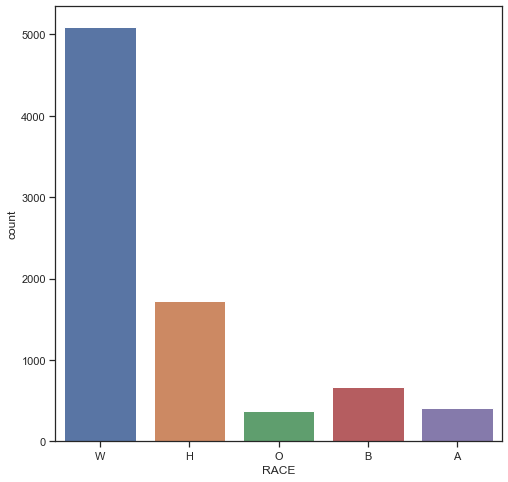

In [337]:
#Number of people injured in a bike collision by race
sns.countplot(x="RACE",data=pt[pt['PARTY_NUMBER_INJURED'].notnull()])

<AxesSubplot:xlabel='PARTY_NUMBER_INJURED', ylabel='PARTY_AGE'>

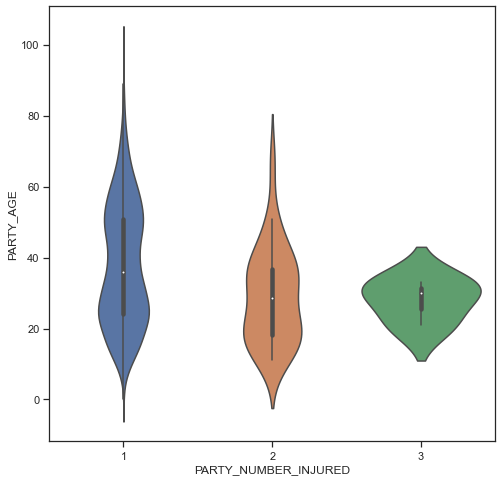

In [338]:
#Age of parties involved in a bike collision, listed by injury level
sns.violinplot(x="PARTY_NUMBER_INJURED", y="PARTY_AGE", data=pt[(pt['PARTY_NUMBER_INJURED']!=0) & (pt['PARTY_AGE']<120) ])

## Merging collision and party data
Join party data to collision data so it's ready for future mapping/analysis.

In [16]:
#normalize the party table so CASE_ID is the unique identifier of each row
pt=pt[pt['PARTY_NUMBER'] <=2].pivot(index="CASE_ID",columns='PARTY_NUMBER',values=['PARTY_TYPE', 'AT_FAULT', 'PARTY_SEX','PARTY_AGE', 'PARTY_SOBRIETY', 'PARTY_DRUG_PHYSICAL', 'DIR_OF_TRAVEL','MOVE_PRE_ACC','PARTY_NUMBER_KILLED', 'PARTY_NUMBER_INJURED','RACE', 'INATTENTION'])
pt.columns=pt.columns.map('{0[0]}_{0[1]}'.format) 
pt

,PARTY_TYPE_1,PARTY_TYPE_2,AT_FAULT_1,AT_FAULT_2,PARTY_SEX_1,PARTY_SEX_2,PARTY_AGE_1,PARTY_AGE_2,PARTY_SOBRIETY_1,PARTY_SOBRIETY_2,...,MOVE_PRE_ACC_1,MOVE_PRE_ACC_2,PARTY_NUMBER_KILLED_1,PARTY_NUMBER_KILLED_2,PARTY_NUMBER_INJURED_1,PARTY_NUMBER_INJURED_2,RACE_1,RACE_2,INATTENTION_1,INATTENTION_2
CASE_ID,,,,,,,,,,,,,,,,,,,,,
3984282,1,4,Y,N,M,M,55,55,A,A,...,B,B,0,1,0,0,W,W,NaN,NaN
4027523,1,4,Y,N,-,M,998,24,G,A,...,B,B,0,0,0,1,NaN,W,NaN,NaN
4027529,4,1,Y,N,F,F,14,32,A,A,...,A,A,0,0,1,0,W,NaN,NaN,NaN
4027535,1,4,Y,N,F,F,40,23,G,G,...,D,B,0,0,0,1,W,H,NaN,NaN
4027541,4,NaN,N,NaN,M,NaN,49,NaN,A,NaN,...,B,NaN,0,NaN,1,NaN,W,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90820890,4,1,Y,N,M,F,25,33,A,A,...,L,B,0,0,1,0,W,W,NaN,NaN
90899652,4,1,Y,N,M,F,27,62,A,A,...,J,B,0,0,1,0,W,W,NaN,NaN
91003196,1,4,Y,N,M,M,42,50,A,A,...,D,B,0,0,0,1,O,H,NaN,NaN


In [17]:
#join normalized party table to collision table
cols.index=cols['CASE_ID']
cols_cl=cols.join(pt,how='left')
cols_cl.head()

,CASE_ID,ACCIDENT_YEAR,COLLISION_DATE,COLLISION_TIME,DAY_OF_WEEK,PRIMARY_RD,SECONDARY_RD,DISTANCE,DIRECTION,INTERSECTION,...,MOVE_PRE_ACC_1,MOVE_PRE_ACC_2,PARTY_NUMBER_KILLED_1,PARTY_NUMBER_KILLED_2,PARTY_NUMBER_INJURED_1,PARTY_NUMBER_INJURED_2,RACE_1,RACE_2,INATTENTION_1,INATTENTION_2
CASE_ID,,,,,,,,,,,,,,,,,,,,,
3984282,3984282,2009,2009-01-06,1916,2,SABRE SPRINGS PKWY,MORNING CREEK DR,644.0,S,N,...,B,B,0,1,0,0,W,W,NaN,NaN
4027529,4027529,2009,2009-01-18,1350,7,TEXAS ST,LINCOLN AV,0.0,NaN,Y,...,A,A,0,0,1,0,W,NaN,NaN,NaN
4027541,4027541,2009,2009-01-25,825,7,MOUNT ACADIA BL,SNEAD AV,12.0,E,N,...,B,NaN,0,NaN,1,NaN,W,NaN,NaN,NaN
4027576,4027576,2009,2009-01-22,1424,4,40TH ST,ADAMS AV,350.0,S,N,...,B,NaN,0,NaN,1,NaN,W,NaN,NaN,NaN
4036424,4036424,2009,2009-01-31,1510,6,30TH ST,MEADE AV,0.0,NaN,N,...,B,NaN,0,NaN,1,NaN,W,NaN,NaN,NaN


## Map the Collisions
Interactively explore the collision patterns on maps.

In [18]:
import pydeck as pdk
#interactively explore where bike collisions are 

layer = pdk.Layer(
    'ScatterplotLayer',
    cols_cl.filter(['POINT_X','POINT_Y'],axis=1),
    get_position=['POINT_X','POINT_Y'],
    auto_highlight=True,
    get_radius=100,          # Radius is given in meters
    get_fill_color=[253, 235, 73, 100],  # Set an RGBA value for fill
    pickable=True)

# Set the viewport location
view_state = pdk.ViewState(
    longitude=-117.163,
    latitude=32.7174,
    zoom=10,
    min_zoom=5,
    max_zoom=15,
    pitch=40.5,
    bearing=-27.36)

r=pdk.Deck(layers=[layer], initial_view_state=view_state,mapbox_key='pk.eyJ1Ijoiandhbmdrb2EiLCJhIjoiY2pvOHZoM3c1MWFlZzNwcGI5aG56eWV3bCJ9.fL_tA706ZiINMj26vZ9PYw')
r.to_html('hexagon-example.html')

In [341]:
ped_df = cols_cl[cols_cl['PARTY_AGE_1']<19].sample(frac=0.5)
bike_df = cols_cl[(cols_cl['PARTY_AGE_1']>=65)&cols_cl['PARTY_AGE_1']<=110].sample(frac=0.5)

ped_df['sev_weight']=ped_df['COLLISION_SEVERITY']/4
bike_df['sev_weight']=bike_df['COLLISION_SEVERITY']/4

COLOR_BREWER_BLUE_SCALE =[
    [240, 249, 232],
    [204, 235, 197],
    [168, 221, 181],
    [123,204, 196],
    [67, 162, 202],
    [8, 104, 172],
]

view = pdk.ViewState(
    longitude=-117.163,
    latitude=32.7174,
    zoom=10)


ped = pdk.Layer(
    "HeatmapLayer",
    data=ped_df,
    opacity=0.75,
    get_position=['POINT_X','POINT_Y'],
    aggregation='"MEAN"',
    color_range=COLOR_BREWER_BLUE_SCALE,
    threshold=0.5,
    get_weight='sev_weight',
    pickable=True,
)

bike = pdk.Layer(
    "HeatmapLayer",
    data=bike_df,
    opacity=0.5,
    get_position=['POINT_X','POINT_Y'],
    threshold=0.5,
    aggregation='"MEAN"',
    get_weight='sev_weight',
    pickable=True,
)


r = pdk.Deck(
    layers=[ped,bike],
    initial_view_state=view,
    mapbox_key='pk.eyJ1Ijoiandhbmdrb2EiLCJhIjoiY2pvOHZoM3c1MWFlZzNwcGI5aG56eWV3bCJ9.fL_tA706ZiINMj26vZ9PYw',
    tooltip={"text": "Concentration of under 18 collisions in blue, concentration of above 65 in orange"},
)

r.to_html("heatmap_layer.html")

## Join Collision Data with Bike Network Data
Introduce the existing and planned bike network dataset maintained by SANDAG. Join collision data to bike lane data as the unit of regression analysis.

<AxesSubplot:>

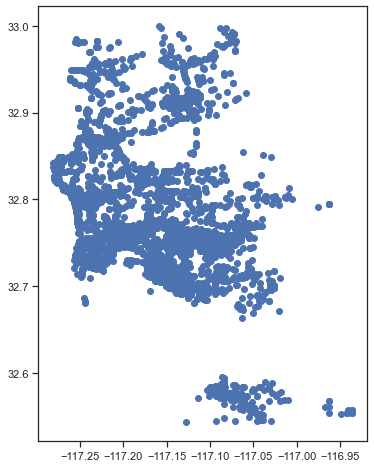

In [342]:
cols_gdf=gpd.GeoDataFrame(cols_cl, geometry=gpd.points_from_xy(cols_cl['POINT_X'],cols_cl['POINT_Y']))
cols_gdf.plot()

In [19]:
#call bike route shapefile from San Diego Association of Governments (SANDAG) Data Warehouse
bl_url='http://seshat.datasd.org/sde/bike_route/bike_routes_datasd.geojson'
response=requests.get(bl_url)
result = response.text
result

'{"type":"FeatureCollection", "features": [\n{"type":"Feature","geometry":{"type":"LineString","coordinates":[[-117.03492941,32.78662852],[-117.03492968,32.78662905],[-117.03493158,32.78663294],[-117.03514365,32.78706589],[-117.03514991,32.78707857],[-117.03515619,32.78709125],[-117.0351625,32.78710391],[-117.03516884,32.78711657],[-117.03517519,32.78712922],[-117.03518157,32.78714186],[-117.03518798,32.78715449],[-117.03519442,32.78716711],[-117.03520088,32.78717973],[-117.03520736,32.78719233],[-117.03520762,32.78719284],[-117.03521387,32.78720492],[-117.0352204,32.78721751],[-117.03522696,32.78723008],[-117.03523355,32.78724265],[-117.03524016,32.78725521],[-117.03524679,32.78726775],[-117.03525345,32.78728029],[-117.03526013,32.78729282],[-117.03526684,32.78730534],[-117.03527357,32.78731785],[-117.03528033,32.78733035],[-117.03528712,32.78734284],[-117.03529392,32.78735532],[-117.03530075,32.78736779],[-117.03530761,32.78738026],[-117.0353145,32.78739271],[-117.0353214,32.78740515

In [20]:
data=json.loads(result)
calls=data['features']
pp.pprint(calls[0])

{'geometry': {'coordinates': [[-117.03492941, 32.78662852],
                              [-117.03492968, 32.78662905],
                              [-117.03493158, 32.78663294],
                              [-117.03514365, 32.78706589],
                              [-117.03514991, 32.78707857],
                              [-117.03515619, 32.78709125],
                              [-117.0351625, 32.78710391],
                              [-117.03516884, 32.78711657],
                              [-117.03517519, 32.78712922],
                              [-117.03518157, 32.78714186],
                              [-117.03518798, 32.78715449],
                              [-117.03519442, 32.78716711],
                              [-117.03520088, 32.78717973],
                              [-117.03520736, 32.78719233],
                              [-117.03520762, 32.78719284],
                              [-117.03521387, 32.78720492],
                              [-117.03522

In [178]:
collection=FeatureCollection(calls)
calls2=gpd.GeoDataFrame.from_features(collection['features'])
calls2=calls2[(calls2.geometry.isnull()==False) ] 
calls2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1394 entries, 0 to 1393
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  1394 non-null   geometry
 1   objectid  1394 non-null   int64   
 2   rd20full  1394 non-null   object  
 3   route     1394 non-null   int64   
 4   class     1394 non-null   object  
dtypes: geometry(1), int64(2), object(2)
memory usage: 65.3+ KB


<AxesSubplot:>

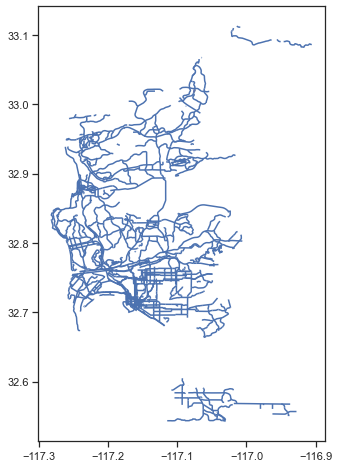

In [179]:
#dissolve line segments by route name and type
bl_route=calls2.dissolve(by=['route','rd20full'])
bl_route.plot()

In [180]:
bl_route.reset_index(inplace=True)
bl_route

,route,rd20full,geometry,objectid,class
0,1,805 Bridge,"LINESTRING (-117.04051 32.55387, -117.04072 32...",117,Multi-Use Path
1,1,805 Path,"LINESTRING (-117.10226 32.71147, -117.10200 32...",194,Multi-Use Path
2,1,94 BIKE PATH,"LINESTRING (-117.07559 32.72314, -117.07561 32...",42,Multi-Use Path
3,1,AVNDA DEL RIO,"LINESTRING (-117.16415 32.76584, -117.16420 32...",238,Multi-Use Path
4,1,BAYSHORE BIKEWAY,"LINESTRING (-117.11800 32.68044, -117.11814 32...",287,Muliti-Use Path
...,...,...,...,...,...
963,15,W HAWTHORN ST,"LINESTRING (-117.16803 32.72683, -117.16860 32...",2656,Bikeways Coming Soon
964,15,W LAUREL ST,"LINESTRING (-117.17370 32.72950, -117.17389 32...",2657,Bikeways Coming Soon
965,15,W MARKET ST,"LINESTRING (-117.16377 32.71147, -117.16437 32...",2658,Bikeways Coming Soon
966,15,WIGHTMAN ST,"LINESTRING (-117.11931 32.74787, -117.11930 32...",2660,Bikeways Coming Soon


In [267]:
#assign State Plane 6 projection for San Deigo area

bl_route=bl_route.set_crs('epsg:2230')
cols_gdf=cols_gdf.set_crs('epsg:2230')

In [268]:
bl_route.crs   #verify that the linear unit used here is feet

<Projected CRS: EPSG:2230>
Name: NAD83 / California zone 6 (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - California - SPCS - 6
- bounds: (-118.15, 32.53, -114.42, 34.08)
Coordinate Operation:
- name: SPCS83 California zone 6 (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

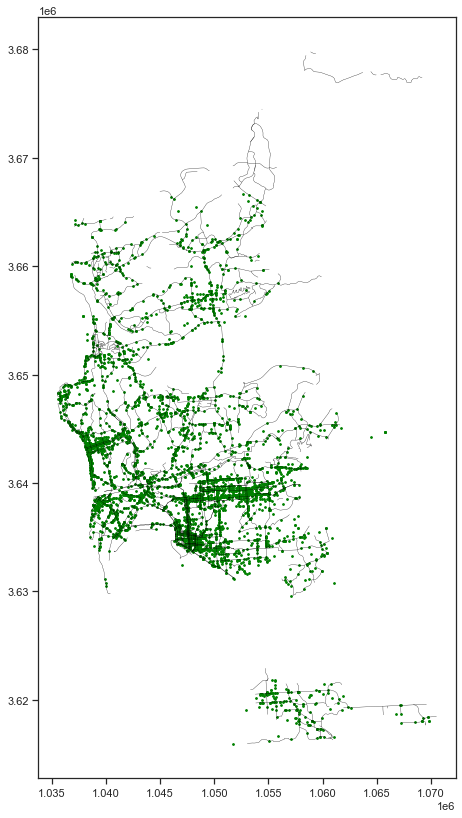

In [269]:
#map collisions against bike network

base = bl_route.plot(color='black', edgecolor='black', linewidth=.3, figsize=(14,14))

cols_proj.plot(ax=base,color='green',markersize=3,)

In [270]:
#Create route length and 50 feet bike lane buffers
bl_buffer=calls_proj['geometry'].buffer(50)

In [271]:
#calculate bike lane length. 
bl_route['length']=bl_route.length

#Add attributes back to buffer gdf
bl_buffer_df=gpd.GeoDataFrame(geometry=bl_buffer,crs=bl_route.crs)
bl_buffer_df=bl_buffer_df.join(bl_route,rsuffix='route').drop(columns='geometryroute')

bl_buffer_df['length'].describe()  #there are some abnormalties in length that will skew the crash rate

count      968.000000
mean      1316.244687
std       1880.923306
min          3.148194
25%        270.263602
50%        705.079171
75%       1516.251560
max      16297.662983
Name: length, dtype: float64

In [272]:
#join bike route to collision
bl_cols=gpd.sjoin(bl_buffer_df,cols_proj,how="inner",op='intersects').reset_index().drop(columns='index')
bl_cols

,geometry,route,rd20full,objectid,class,length,index_right,CASE_ID,ACCIDENT_YEAR,COLLISION_DATE,...,MOVE_PRE_ACC_1,MOVE_PRE_ACC_2,PARTY_NUMBER_KILLED_1,PARTY_NUMBER_KILLED_2,PARTY_NUMBER_INJURED_1,PARTY_NUMBER_INJURED_2,RACE_1,RACE_2,INATTENTION_1,INATTENTION_2
0,"POLYGON ((1053152.708 3634654.569, 1053143.622...",1,805 Path,194,Multi-Use Path,458.554773,8713964,8713964,2018,2018-10-06,...,E,B,0,0,1,0,H,A,NaN,NaN
1,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,6710954,6710954,2014,2014-11-15,...,B,NaN,0,NaN,1,NaN,A,NaN,NaN,NaN
2,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,5251359,5251359,2011,2011-07-18,...,-,O,0,0,1,0,H,W,-,NaN
3,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,8502910,8502910,2017,2017-11-06,...,B,NaN,0,NaN,1,NaN,A,NaN,NaN,NaN
4,"POLYGON ((1051017.358 3633112.045, 1051017.335...",8,S 32ND ST,2369,Other Suggested Routes,2184.763330,8502910,8502910,2017,2017-11-06,...,B,NaN,0,NaN,1,NaN,A,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,"POLYGON ((1046821.685 3634318.561, 1046768.398...",15,W HARBOR DR,2655,Bikeways Coming Soon,880.092296,8751438,8751438,2018,2018-10-20,...,B,B,0,0,0,1,H,W,NaN,NaN
3994,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,8769234,8769234,2018,2018-12-08,...,B,NaN,0,NaN,1,NaN,W,NaN,NaN,NaN
3995,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,8696246,8696246,2018,2018-08-03,...,B,NaN,0,NaN,1,NaN,W,NaN,NaN,NaN
3996,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,5844608,5844608,2012,2012-09-26,...,B,B,0,0,1,0,W,H,NaN,NaN


In [273]:
#create dummy variables for lighting
bl_cols=bl_cols[bl_cols['CASE_ID'].notna()]
lighting=pd.get_dummies(bl_cols['LIGHTING'],prefix='Lighting')#.rename(columns={'A':'Daylight','B':'Dusk - Dawn','C':'Dark - Street Lights','D':'Dark - No Street Lights','E':'Dark- St Light not functioning'})


In [274]:
lighting['dark_lighting']=lighting['Lighting_B']+lighting['Lighting_C']+lighting['Lighting_D']+lighting['Lighting_E']
lighting

,Lighting_-,Lighting_A,Lighting_B,Lighting_C,Lighting_D,Lighting_E,dark_lighting
0,0,0,0,1,0,0,1
1,0,1,0,0,0,0,0
2,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
3993,0,1,0,0,0,0,0
3994,0,0,0,1,0,0,1
3995,0,1,0,0,0,0,0
3996,0,0,0,1,0,0,1


In [275]:
bl_cols=bl_cols.join(lighting['dark_lighting'],how='left')

,geometry,route,rd20full,objectid,class,length,index_right,CASE_ID,ACCIDENT_YEAR,COLLISION_DATE,...,MOVE_PRE_ACC_2,PARTY_NUMBER_KILLED_1,PARTY_NUMBER_KILLED_2,PARTY_NUMBER_INJURED_1,PARTY_NUMBER_INJURED_2,RACE_1,RACE_2,INATTENTION_1,INATTENTION_2,dark_lighting
0,"POLYGON ((1053152.708 3634654.569, 1053143.622...",1,805 Path,194,Multi-Use Path,458.554773,8713964,8713964,2018,2018-10-06,...,B,0,0,1,0,H,A,NaN,NaN,1
1,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,6710954,6710954,2014,2014-11-15,...,NaN,0,NaN,1,NaN,A,NaN,NaN,NaN,0
2,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,5251359,5251359,2011,2011-07-18,...,O,0,0,1,0,H,W,-,NaN,0
3,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,8502910,8502910,2017,2017-11-06,...,NaN,0,NaN,1,NaN,A,NaN,NaN,NaN,0
4,"POLYGON ((1051017.358 3633112.045, 1051017.335...",8,S 32ND ST,2369,Other Suggested Routes,2184.763330,8502910,8502910,2017,2017-11-06,...,NaN,0,NaN,1,NaN,A,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,"POLYGON ((1046821.685 3634318.561, 1046768.398...",15,W HARBOR DR,2655,Bikeways Coming Soon,880.092296,8751438,8751438,2018,2018-10-20,...,B,0,0,0,1,H,W,NaN,NaN,0
3994,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,8769234,8769234,2018,2018-12-08,...,NaN,0,NaN,1,NaN,W,NaN,NaN,NaN,1
3995,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,8696246,8696246,2018,2018-08-03,...,NaN,0,NaN,1,NaN,W,NaN,NaN,NaN,0
3996,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,5844608,5844608,2012,2012-09-26,...,B,0,0,1,0,W,H,NaN,NaN,1


In [276]:
#create age bins for both parties

ageBins=[0,18,65,110]
bl_cols['PT1_ageBins']=pd.cut(bl_cols['PARTY_AGE_1'],ageBins)
bl_cols['PT2_ageBins']=pd.cut(bl_cols['PARTY_AGE_2'],ageBins)

PT1_ageBins_df=pd.get_dummies(bl_cols['PT1_ageBins'],prefix='PT1_ageBins')
PT2_ageBins_df=pd.get_dummies(bl_cols['PT2_ageBins'],prefix='PT2_ageBins')

bl_cols=bl_cols.join(PT1_ageBins_df).join(PT2_ageBins_df)
bl_cols

,geometry,route,rd20full,objectid,class,length,index_right,CASE_ID,ACCIDENT_YEAR,COLLISION_DATE,...,INATTENTION_2,dark_lighting,PT1_ageBins,PT2_ageBins,"PT1_ageBins_(0, 18]","PT1_ageBins_(18, 65]","PT1_ageBins_(65, 110]","PT2_ageBins_(0, 18]","PT2_ageBins_(18, 65]","PT2_ageBins_(65, 110]"
0,"POLYGON ((1053152.708 3634654.569, 1053143.622...",1,805 Path,194,Multi-Use Path,458.554773,8713964,8713964,2018,2018-10-06,...,NaN,1,"(0.0, 18.0]","(18.0, 65.0]",1,0,0,0,1,0
1,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,6710954,6710954,2014,2014-11-15,...,NaN,0,"(18.0, 65.0]",NaN,0,1,0,0,0,0
2,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,5251359,5251359,2011,2011-07-18,...,NaN,0,"(18.0, 65.0]","(0.0, 18.0]",0,1,0,1,0,0
3,"POLYGON ((1051798.682 3631173.127, 1051776.902...",1,BAYSHORE BIKEWAY,287,Muliti-Use Path,890.694208,8502910,8502910,2017,2017-11-06,...,NaN,0,"(18.0, 65.0]",NaN,0,1,0,0,0,0
4,"POLYGON ((1051017.358 3633112.045, 1051017.335...",8,S 32ND ST,2369,Other Suggested Routes,2184.763330,8502910,8502910,2017,2017-11-06,...,NaN,0,"(18.0, 65.0]",NaN,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,"POLYGON ((1046821.685 3634318.561, 1046768.398...",15,W HARBOR DR,2655,Bikeways Coming Soon,880.092296,8751438,8751438,2018,2018-10-20,...,NaN,0,NaN,"(0.0, 18.0]",0,0,0,1,0,0
3994,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,8769234,8769234,2018,2018-12-08,...,NaN,1,"(18.0, 65.0]",NaN,0,1,0,0,0,0
3995,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,8696246,8696246,2018,2018-08-03,...,NaN,0,"(65.0, 110.0]",NaN,0,0,1,0,0,0
3996,"POLYGON ((1046833.717 3636013.915, 1046757.826...",15,W HAWTHORN ST,2656,Bikeways Coming Soon,543.756019,5844608,5844608,2012,2012-09-26,...,NaN,1,"(18.0, 65.0]","(0.0, 18.0]",0,1,0,1,0,0


In [277]:
#create dummy variables for race

PT1_race_df=pd.get_dummies(bl_cols['RACE_1'],prefix='PT1_race')
PT2_race_df=pd.get_dummies(bl_cols['RACE_2'],prefix='PT2_race')

bl_cols=bl_cols.join(PT1_race_df).join(PT2_race_df)

In [278]:
#integrate race variables
bl_cols['asian']=bl_cols['PT1_race_A']+bl_cols['PT2_race_A']
bl_cols['white']=bl_cols['PT1_race_W']+bl_cols['PT2_race_W']
bl_cols['hispanic']=bl_cols['PT1_race_H']+bl_cols['PT2_race_H']
bl_cols['black']=bl_cols['PT1_race_B']+bl_cols['PT2_race_B']
bl_cols=bl_cols.drop(columns=['PT1_race_O','PT1_race_A','PT1_race_B','PT1_race_H','PT1_race_W','PT2_race_A','PT2_race_B','PT2_race_H','PT2_race_O','PT2_race_W'])


In [296]:
#aggregate collision data by bike route type and name

bl_cols2=bl_cols.groupby(['route','rd20full']).agg({'CASE_ID':'count',
                                                    'length':'mean',
                                          'COUNT_BICYCLIST_KILLED':'sum',
                                           'COUNT_BICYCLIST_INJURED':'sum',
                                                    'dark_lighting':'sum',
                                                   'PT1_ageBins_(0, 18]':'sum',
                                                   'PT2_ageBins_(0, 18]':'sum',
                                                   'PT1_ageBins_(65, 110]':'sum',
                                                   'PT2_ageBins_(65, 110]':'sum',
                                                   'asian':'sum',
                                                    'white':'sum',
                                                    'hispanic':'sum',
                                                    'black':'sum'
                                                   })
#.sort_values(['CASE_ID','COUNT_BICYCLIST_KILLED'],ascending=False)
bl_cols2=bl_cols2.rename(columns={'PT1_ageBins_(65, 110]':'PT1_above65','PT2_ageBins_(65, 110]':'PT2_above65','PT1_ageBins_(0, 18]':'PT1_under18','PT2_ageBins_(0, 18]':'PT2_under18'})

In [297]:
bl_cols2=bl_cols2.reset_index().astype({'route': 'str'})

In [298]:
#drop outliers and calculate crash rate

bl_cols2=bl_cols2[(bl_cols2['length']>500) & (bl_cols2['CASE_ID']>1)]
bl_cols2['crash_rate']=bl_cols2['CASE_ID']/(bl_cols2['length']/5280)
bl_cols2

,route,rd20full,CASE_ID,length,COUNT_BICYCLIST_KILLED,COUNT_BICYCLIST_INJURED,dark_lighting,PT1_under18,PT2_under18,PT1_above65,PT2_above65,asian,white,hispanic,black,crash_rate
1,1,BAYSHORE BIKEWAY,4,890.694208,0,4,0,0,2,0,0,2,2,2,0,23.711842
2,1,BAYSIDE WK,16,2980.732840,0,16,3,3,2,0,3,1,22,4,0,28.342023
10,1,FRIARS ROAD BIKE PATH,2,3503.383954,0,2,1,0,0,0,0,0,2,0,0,3.014229
13,1,I-805 BIKE PATH,5,2333.403746,0,5,0,2,1,0,0,1,8,0,0,11.313944
15,1,MLK Path,14,1064.828034,0,18,8,1,3,0,0,0,13,3,1,69.419660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,15,W CEDAR ST,7,675.120428,0,7,1,0,0,0,0,0,7,1,0,54.745788
668,15,W GRAPE ST,4,580.662815,0,4,1,0,0,0,0,1,4,2,1,36.372227
669,15,W HARBOR DR,17,880.092296,0,18,8,0,2,1,0,0,16,5,3,101.989303
670,15,W HAWTHORN ST,8,543.756019,0,8,3,0,1,1,0,1,8,3,1,77.681899


## Regression Analysis
Assess the factors that influence the crash rate of a bike lane: lighting condition, bike lane type (multi-use path, bike lane, bike route, and planned bike facilities), involved party race, and involved party age (under 18 and above 65).

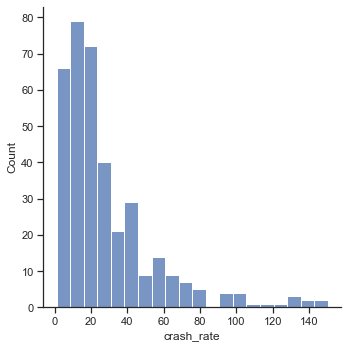

In [325]:
#crash rate has a long tail

sns.displot(bl_cols2['crash_rate'])

In [318]:
y,X=dmatrices('crash_rate~asian+black+hispanic+white',
             data=bl_cols2, return_type='dataframe')
mod=sm.OLS(y,X)
res=mod.fit()
residuals = res.resid
predicted = res.fittedvalues
observed = y
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:             crash_rate   R-squared:                       0.459
Model:                            OLS   Adj. R-squared:                  0.453
Method:                 Least Squares   F-statistic:                     77.19
Date:                Mon, 14 Dec 2020   Prob (F-statistic):           2.39e-47
Time:                        20:11:11   Log-Likelihood:                -1626.7
No. Observations:                 369   AIC:                             3263.
Df Residuals:                     364   BIC:                             3283.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     12.7952      1.486      8.610      0.0

^ The result above shows comparing to being "other race", being Asian decrease the crash rate, being white or black slightly increase the crash rate, and being Hispanic is not a significant factor to crash rate.

In [301]:
y,X=dmatrices('crash_rate~dark_lighting',
             data=bl_cols2, return_type='dataframe')
mod=sm.OLS(y,X)
res=mod.fit()
residuals = res.resid
predicted = res.fittedvalues
observed = y
print(res.summary())


                            OLS Regression Results                            
Dep. Variable:             crash_rate   R-squared:                       0.360
Model:                            OLS   Adj. R-squared:                  0.358
Method:                 Least Squares   F-statistic:                     206.4
Date:                Mon, 14 Dec 2020   Prob (F-statistic):           1.92e-37
Time:                        20:05:34   Log-Likelihood:                -1657.7
No. Observations:                 369   AIC:                             3319.
Df Residuals:                     367   BIC:                             3327.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        17.1340      1.386     12.361

^ The result above shows that comparing to daylight condition, dark lighting condition contributes more to higher crash rates and the relationship is significant.

In [328]:
y,X=dmatrices('crash_rate~PT1_under18+PT2_under18',
             data=bl_cols2, return_type='dataframe')
mod=sm.OLS(y,X)
res=mod.fit()
residuals = res.resid
predicted = res.fittedvalues
observed = y
print(res.summary())

                               OLS Regression Results                              
Dep. Variable:     COUNT_BICYCLIST_INJURED   R-squared:                       0.513
Model:                                 OLS   Adj. R-squared:                  0.511
Method:                      Least Squares   F-statistic:                     193.0
Date:                     Mon, 14 Dec 2020   Prob (F-statistic):           5.80e-58
Time:                             20:16:01   Log-Likelihood:                -1188.3
No. Observations:                      369   AIC:                             2383.
Df Residuals:                          366   BIC:                             2394.
Df Model:                                2                                         
Covariance Type:                 nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------


^ The result shows being under 18 increase the crash rate and the result is significant.

In [303]:
y,X=dmatrices('crash_rate~PT1_above65+PT2_above65',
             data=bl_cols2, return_type='dataframe')
mod=sm.OLS(y,X)
res=mod.fit()
residuals = res.resid
predicted = res.fittedvalues
observed = y
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:             crash_rate   R-squared:                       0.086
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                     17.28
Date:                Mon, 14 Dec 2020   Prob (F-statistic):           6.74e-08
Time:                        20:06:00   Log-Likelihood:                -1723.4
No. Observations:                 369   AIC:                             3453.
Df Residuals:                     366   BIC:                             3464.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      23.1873      1.645     14.096      

^Being above 65 does not explain as much of the change in crash rates.

In [304]:
y,X=dmatrices('crash_rate~route',
             data=bl_cols2, return_type='dataframe')
mod=sm.OLS(y,X)
res=mod.fit()
residuals = res.resid
predicted = res.fittedvalues
observed = y
print(res.summary())


                            OLS Regression Results                            
Dep. Variable:             crash_rate   R-squared:                       0.107
Model:                            OLS   Adj. R-squared:                  0.098
Method:                 Least Squares   F-statistic:                     10.96
Date:                Mon, 14 Dec 2020   Prob (F-statistic):           2.11e-08
Time:                        20:06:19   Log-Likelihood:                -1719.0
No. Observations:                 369   AIC:                             3448.
Df Residuals:                     364   BIC:                             3468.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      17.1453      6.058      2.830      

[2] Route type 15 = planned bike facilities
    Route type 1 = multi-use path
    Route type 2 = bike lane
    Route type 3 = bike route
    Route type 8 = other propsed bike lanes

The result shows that existing bike lane is not explaining the changes in crash rate.
Proposed bike facilities are highly correlated with crash rate, indicating the potential safety improvement from constructing bike lanes.

In [323]:
y,X=dmatrices('crash_rate~PT1_under18+PT1_above65+dark_lighting+route+asian+black+white',
             data=bl_cols2, return_type='dataframe')
mod=sm.OLS(y,X)
res=mod.fit()
residuals = res.resid
predicted = res.fittedvalues
observed = y
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:             crash_rate   R-squared:                       0.525
Model:                            OLS   Adj. R-squared:                  0.512
Method:                 Least Squares   F-statistic:                     39.59
Date:                Mon, 14 Dec 2020   Prob (F-statistic):           4.50e-52
Time:                        20:13:43   Log-Likelihood:                -1602.6
No. Observations:                 369   AIC:                             3227.
Df Residuals:                     358   BIC:                             3270.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         8.1488      4.543      1.794

^ combining all the significant factors in one model, we're explaining about 52% of the change in crash rate. Specifically, being black, white, or in a dark lighting condition significantly increase the crash rate.

In [333]:
y,X=dmatrices('COUNT_BICYCLIST_INJURED~PT1_under18+PT1_above65+PT2_under18+PT2_above65',
             data=bl_cols2, return_type='dataframe')
mod=sm.OLS(y,X)
res=mod.fit()
residuals = res.resid
predicted = res.fittedvalues
observed = y
print(res.summary())

                               OLS Regression Results                              
Dep. Variable:     COUNT_BICYCLIST_INJURED   R-squared:                       0.677
Model:                                 OLS   Adj. R-squared:                  0.673
Method:                      Least Squares   F-statistic:                     190.3
Date:                     Mon, 14 Dec 2020   Prob (F-statistic):           7.68e-88
Time:                             20:17:30   Log-Likelihood:                -1112.9
No. Observations:                      369   AIC:                             2236.
Df Residuals:                          364   BIC:                             2255.
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------


^ The final regression looks at the relationship between vulnerable age groups and the number of injury cases. Having vulnerable pouplation involved in a collision can increase the likelihood of bicyclist injuries.

## Conclusion
From the analysis of the collision and party data of bicycle-involved traffic crashes in San Diego from 2009 to 2019, we learned that the total bike collision has been declining since 2015, mainly contributed by the decrease in Visible Injury and slight decrease in Severe Injury and Complaint of Pain. 

In terms of the parties involved in a bike collision, more than half of the people injured or died in a bike crash are white non-Hispanic, followed by Hispanic. Comparing to the overall demographics in San Diego, the disapproportinate amount of white parties in bike accidents implied that they are the predominat ethnic group that bike frequently. 

The violin plot shows that people in their 20s are more likely to get into a serious bike crash that results in servere or visible injuries. People in their 50s are also likely to get into a servere injury bike crash while people in their 30s are likely to get into a visible injury collision. Bike collisions resulted in Complaint of Pain are likely to happen to people between 20 to 40. The age distribution in regard to collision serverity level calls for bike workshops and education programs targeted to those age groups.

The regression analysis uses exisiting and planned bike lane as unit of analysis, and look at the factors that impact the crash rate of a bike lane. The number of parties that are white, black, or in dark lighting conditions would increase the crash rate while number of parties under 18 is negatively correlated with crash rate. The under 18 and above 65 population contributes to higher bike injury cases, indicating policy programs along with infrastructure should focus on biking experience not just for the most fit, but also for more diverse users. 